<a href="https://colab.research.google.com/github/AnushkaYeole21/Deep_Learning/blob/main/Perceptron_trick.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from sklearn.datasets import make_classification
import numpy as np
import pandas as pd
X, y = make_classification(n_samples=100, n_features=2, n_informative=1, n_redundant=0, n_classes=2, n_clusters_per_class=1, random_state=41, hypercube=False, class_sep=10)

In [ ]:
import matplotlib.pyplot as plt

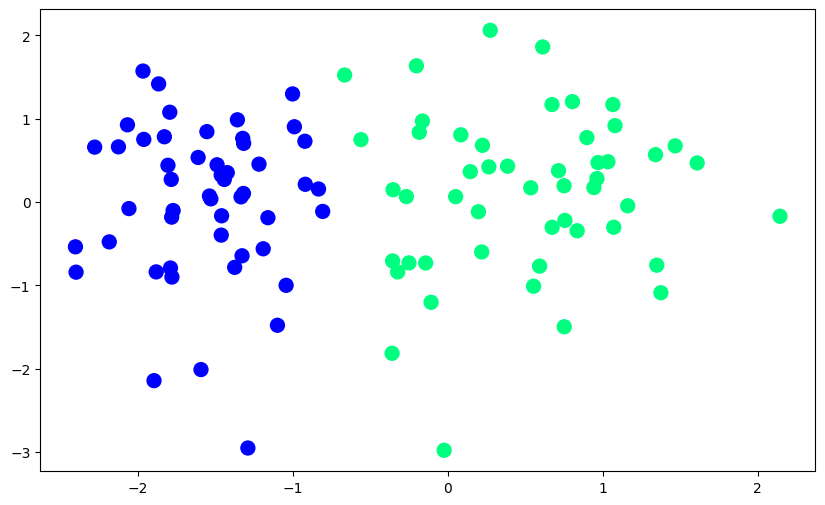

In [ ]:
plt.figure(figsize=(10,6))
plt.scatter(X[:,0], X[:,1], c=y, cmap='winter', s=100)

In [ ]:
def Perceptron(X,y):

  X = np.insert(X,0,1,axis=1)
  weights = np.ones(X.shape[1])
  lr = 0.1

  for i in range(1000):
    j = np.random.randint(0, 100)
    y_hat = step(np.dot(X[j], weights))
    weights = weights + lr*(y[j]-y_hat)*X[j]

  return weights[0], weights[1:]


In [ ]:
np.random.randint(0, 100)

9

In [ ]:
def step(z):
  return 1 if z>0 else 0

In [ ]:
intercept_, coef_ = Perceptron(X,y)

print(coef_)
print(intercept_)

[1.2776621  0.16813562]
0.9


In [ ]:
m = -(coef_[0]/coef_[1])
b = -(intercept_/coef_[1])

In [ ]:
x_input = np.linspace(-3,3,100)
y_input = m*x_input + b

(-3.0, 2.0)

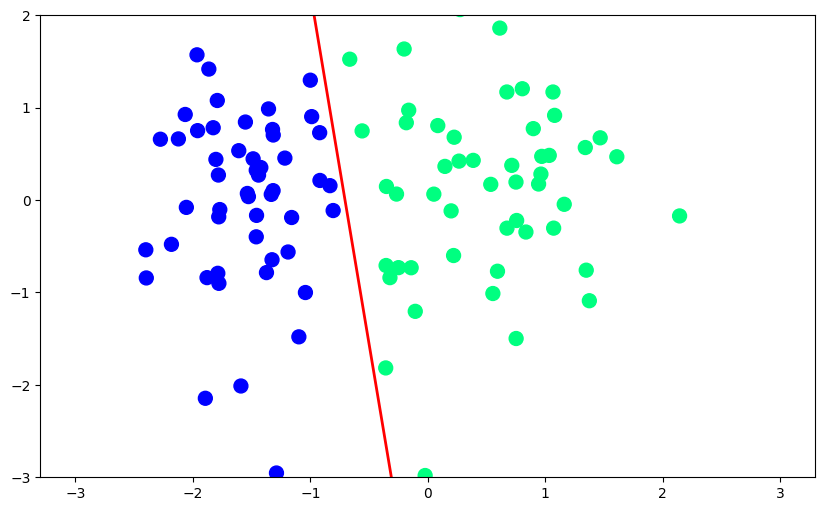

In [ ]:
plt.figure(figsize=(10,6))
plt.scatter(X[:,0], X[:,1], c=y, cmap='winter', s=100)
plt.plot(x_input, y_input, color='red', linewidth = 2)
plt.ylim(-3, 2)

In [ ]:
def step(x):
    return 1 if x >= 0 else -1

def Perceptron(X,y):
  m=[]
  b=[]

  X = np.insert(X,0,1,axis=1)
  weights = np.ones(X.shape[1])
  lr = 0.1

  for i in range(200):
    j = np.random.randint(0, 100)
    y_hat = step(np.dot(X[j], weights))
    weights = weights + lr*(y[j]-y_hat)*X[j]

    m.append(-(weights[1]/weights[2]))
    b.append(-(weights[0]/weights[2]))

  return m, b

In [ ]:
m,b = Perceptron(X,y)

In [ ]:
%matplotlib inline
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from IPython.display import HTML

/usr/local/lib/python3.10/dist-packages/matplotlib/animation.py:892: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


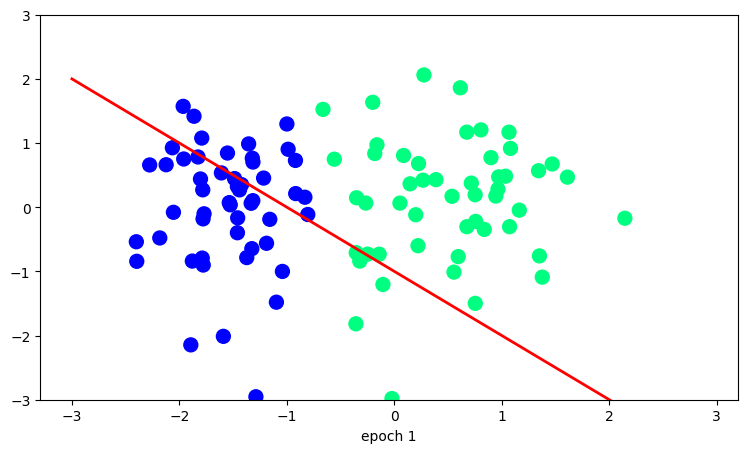

In [ ]:
fig, ax=plt.subplots(figsize=(9,5))

x_i = np.arange(-3, 3, 0.1)
y_i = x_i * m[0] + b[0]
ax.scatter(X[:,0], X[:,1], c=y, cmap='winter', s=100)
line, = ax.plot(x_i, x_i*m[0] + b[0], 'r-', linewidth=2)
plt.ylim(-3,3)
def update(i):
  label = 'epoch {0}'.format(i + 1)
  line.set_ydata(x_i*m[i] + b[i])
  ax.set_xlabel(label)
  return line, ax

anim = FuncAnimation(fig, update, frames=200, interval=100, blit=False)
HTML(anim.to_jshtml())